In [ ]:
%matplotlib inline
import os
import importlib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
pd.set_option('display.max_columns', None)

In [ ]:
data = pd.read_csv(
    os.path.join('train.csv.bz2')
)

In [ ]:
def _encode_dates(X):
    # Make sure that DateOfDeparture is of dtype datetime
    X = X.copy()  # modify a copy of X
    X.loc[:, "DateOfDeparture"] = pd.to_datetime(X['DateOfDeparture'])
    # Encode the date information from the DateOfDeparture columns
    X.loc[:, 'month'] = X['DateOfDeparture'].dt.month
    X.loc[:, 'day'] = X['DateOfDeparture'].dt.day
    X.loc[:, 'weekday'] = X['DateOfDeparture'].dt.weekday
    X.loc[:, 'week'] = X['DateOfDeparture'].dt.week
    X.loc[:, 'n_days'] = X['DateOfDeparture'].apply(
        lambda date: (date - pd.to_datetime("1970-01-01")).days
    )
    
    #ADD Holidays
    we = [4, 5, 6]
    ho_we = [51, 35, 21, 26, 46]
    ho = [1, 52, 27, 47]
    ho_0 = [36, 22]
    summer = range(22, 35)
    X.loc[:, 'holiday'] = np.where((X['week'].isin(ho)) |
                                    ((X['week'].isin(ho_we)) & (X['weekday'].isin(we))) |
                                    ((X['week'].isin(ho_0)) & (X['weekday'] == 0)) |
                                   ((X['week'].isin(summer)) & (X['weekday'] == 5))
                                   , 1, 0)
    # Finally we can drop the original columns from the dataframe
    return X.drop(columns=["DateOfDeparture", "std_wtd"])   

X = _encode_dates(data)
X

In [4]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
le.fit(X['Arrival'].unique())

X['Arrival'] = le.transform(X['Arrival'])
X['Departure'] = le.transform(X['Departure'])

le_name_mapping = dict(zip(le.classes_, le.transform(le.classes_)))
print(le_name_mapping)

{'ATL': 0, 'BOS': 1, 'CLT': 2, 'DEN': 3, 'DFW': 4, 'DTW': 5, 'EWR': 6, 'IAH': 7, 'JFK': 8, 'LAS': 9, 'LAX': 10, 'LGA': 11, 'MCO': 12, 'MIA': 13, 'MSP': 14, 'ORD': 15, 'PHL': 16, 'PHX': 17, 'SEA': 18, 'SFO': 19}


In [5]:
from sklearn.preprocessing import KBinsDiscretizer
KBins = KBinsDiscretizer(n_bins=9, encode='ordinal', strategy='kmeans')
X.loc[:, 'WeeksToDeparture'] = KBins.fit_transform(X[['WeeksToDeparture']])
X.head()

,Departure,Arrival,WeeksToDeparture,log_PAX,month,day,weekday,week,n_days,holiday
0,15,4,5.0,12.331296,6,19,1,25,15510,0
1,9,3,6.0,10.775182,9,10,0,37,15593,0
2,3,10,3.0,11.083177,10,5,4,40,15618,0
3,0,15,4.0,11.169268,10,9,6,40,15256,0
4,3,19,4.0,11.269364,2,21,1,8,15391,0


In [6]:
print(np.quantile(X.loc[:, 'log_PAX'], 0.1), np.quantile(X.loc[:, 'log_PAX'], 0.9))

9.77573109858 12.2414314184


In [7]:
X_trem = X.copy()
X_trem.loc[:, 'trem'] = np.where((X_trem['log_PAX']> 12) | (X_trem['log_PAX'] < 9), 1, 0)
X_low = X_trem[X_trem['trem']==0]
X_trem = X_trem[X_trem['trem']==1]
y_low = X_low[['log_PAX']]
y_trem = X_trem[['log_PAX']]
X_trem.drop(['log_PAX', 'trem'], axis=1, inplace=True)
X_low.drop(['log_PAX', 'trem'], axis=1, inplace=True)

In [55]:
train = X.copy()
y = train[['log_PAX']]
train.drop(['log_PAX'], axis=1, inplace=True)
from xgboost import XGBRegressor

#regressor = XGBRegressor(colsample_bytree= 0.7, learning_rate = 0.03, max_depth = 10, min_child_weight = 3,
#                        n_estimators = 2000, early_stopping_rounds = 10, nthread = 4,
#                         objective = 'reg:squarederror', subsample= 0.7)

regressor = XGBRegressor()

regressor.fit(train, y)

[14:27:47] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


XGBRegressor()

In [56]:
print(regressor)

XGBRegressor()


In [58]:
print('Score on the all dataset', regressor.score(train, y))
print('Score on the LOW dataset', regressor.score(X_low, y_low))
print('Score on the TREM dataset', regressor.score(X_trem, y_trem))

Score on the all dataset 0.6567751282096042
Score on the LOW dataset 0.5245660329240155
Score on the TREM dataset 0.6473076598583845


## SHAP Interpretability

In [59]:
import shap
# define the explainer
explainer = shap.TreeExplainer(regressor)
# calculate the shape value
shap_values = explainer.shap_values(train)

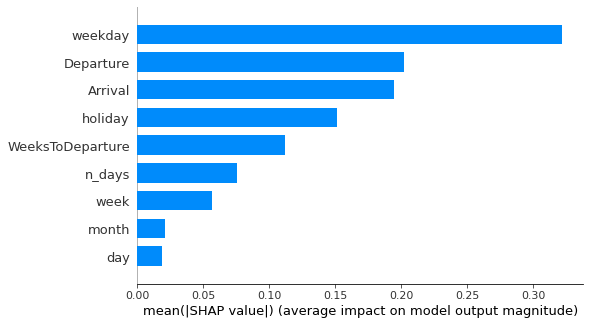

In [60]:
#Variable Importance graphic
feature_names = train.columns
shap.summary_plot(shap_values, train, plot_type="bar", feature_names = feature_names)

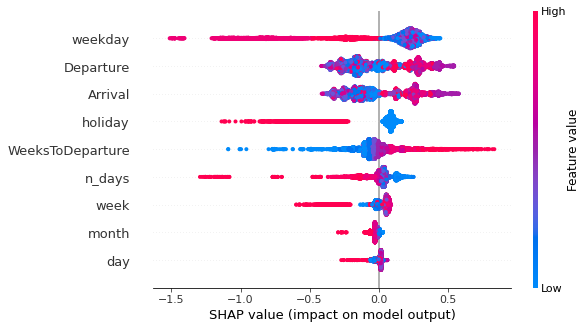

In [61]:
# summary plot
shap.summary_plot(shap_values, train, feature_names)

In [62]:
#global interpretation 
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values, train, feature_names=feature_names)

//anaconda3/lib/python3.7/site-packages/shap/plots/force.py:141: UserWarning: shap.force_plot is slow for many thousands of rows, try subsampling your data.
  warnings.warn("shap.force_plot is slow for many thousands of rows, try subsampling your data.")


In [63]:
#Force Plot
shap.initjs()
y_result_test=regressor.predict(train)

i = 131
print("For the", i,"th value the predicted value of y is" ,y_result_test[i],
       ". Nevertheless, the true value of y is",y.loc[i] )

shap.force_plot(explainer.expected_value, shap_values[i,:], train.iloc[i,:],feature_names=feature_names)

For the 131 th value the predicted value of y is 11.774914 . Nevertheless, the true value of y is log_PAX    13.008978
Name: 131, dtype: float64


In [64]:
i = 119
print("For the", i,"th value the predicted value of y is" ,y_result_test[i],
       ". Nevertheless, the true value of y is",y.loc[i] )

shap.force_plot(explainer.expected_value, shap_values[i,:], traintrain = X.copy()
y = train[['log_PAX']]
train.drop(['log_PAX'], axis=1, inplace=True)
train = train.values
from xgboost import XGBRegressor

#regressor = XGBRegressor(colsample_bytree= 0.7, learning_rate = 0.03, max_depth = 10, min_child_weight = 3,
#                        n_estimators = 2000, early_stopping_rounds = 10, nthread = 4,
#                         objective = 'reg:squarederror', subsample= 0.7)

regressor = XGBRegressor()

regressor.fit(train, y).iloc[i,:],feature_names=feature_names)

For the 119 th value the predicted value of y is 10.440329 . Nevertheless, the true value of y is log_PAX    8.285437
Name: 119, dtype: float64


In [65]:
i = 1
print("For the", i,"th value the predicted value of y is" ,y_result_test[i],
       ". Nevertheless, the true value of y is",y.loc[i] )

shap.force_plot(explainer.expected_value, shap_values[i,:], train.iloc[i,:],feature_names=feature_names)

For the 1 th value the predicted value of y is 10.806837 . Nevertheless, the true value of y is log_PAX    10.775182
Name: 1, dtype: float64


In [66]:
i = 2
print("For the", i,"th value the predicted value of y is" ,y_result_test[i],
       ". Nevertheless, the true value of y is",y.loc[i] )

shap.force_plot(explainer.expected_value, shap_values[i,:], train.iloc[i,:],feature_names=feature_names)

For the 2 th value the predicted value of y is 11.286623 . Nevertheless, the true value of y is log_PAX    11.083177
Name: 2, dtype: float64


## Lime interpretability

In [67]:
train = X.copy()
y = train[['log_PAX']]
train.drop(['log_PAX'], axis=1, inplace=True)
feature_names = train.columns
train = train.values
from xgboost import XGBRegressor

#regressor = XGBRegressor(colsample_bytree= 0.7, learning_rate = 0.03, max_depth = 10, min_child_weight = 3,
#                        n_estimators = 2000, early_stopping_rounds = 10, nthread = 4,
#                         objective = 'reg:squarederror', subsample= 0.7)

regressor = XGBRegressor()

regressor.fit(train, y)

[14:29:08] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


XGBRegressor()

In [68]:
import lime
from lime import lime_tabular

categorical_features = ['Departure', 'Arrival', 'holiday', 'WeeksToDeparture']

lime_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(train),
    feature_names=feature_names,
    class_names=['log_PAX'],
    #categorical_features=categorical_features,
    mode='regression'
)

In [71]:
i = 1

exp = lime_explainer.explain_instance(
    data_row=train[i], 
    predict_fn=regressor.predict
)

exp.show_in_notebook(show_table=True)

In [72]:
i = 2

exp = lime_explainer.explain_instance(
    data_row=train[i], 
    predict_fn=regressor.predict
)

exp.show_in_notebook(show_table=True)

In [73]:
i = 119

exp = lime_explainer.explain_instance(
    data_row=train[i], 
    predict_fn=regressor.predict
)

exp.show_in_notebook(show_table=True)

In [74]:
i = 131

exp = lime_explainer.explain_instance(
    data_row=train[i], 
    predict_fn=regressor.predict
)

exp.show_in_notebook(show_table=True)